# Assingment 06

# EE-527 Machine Learning Laboratory

## Group Members
    RAJENDRA KUJUR (214161008)
    ROHIT RAJ SINGH CHAUHAN (214161009)

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib import cm
from math import e

### Problem 1 Traveling Salesman Problemt

Reading from att48_d.txt and storing into distance matrix

In [2]:
distance_matrix = pd.read_csv("att48_d.txt", sep = '      ', header=None)
# distance_matrix

/home/rajendra/.local/lib/python3.8/site-packages/pandas/util/_decorators.py:311: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  return func(*args, **kwargs)


Reading from att48_xy.txt and storing into coordinates

In [3]:
coordinates = pd.read_csv("att48_xy.txt", sep = ' ', names = ['x','y'],skipinitialspace = True)
# coordinates

Generate population

In [4]:
def intializePaths(popSize):
    totalPaths = []
    
    # iterate until we generate required number of paths
    while len(totalPaths) < popSize:
        
        # start fresh and append 0 as the starting position (since 1 is starting city and indexing starts from 0
        # so 0 is considered as city 1)
        new_path = np.array(0, dtype = 'int')
        remaining_points = np.arange(48)
        remaining_points = np.delete(remaining_points, 0)
        
        # generate until the list becomes empty or all the cities are visited
        while len(remaining_points) > 0:
            new_point = np.random.choice(remaining_points)
            
            # make the city visited and hence delete it from array
            remaining_points = np.delete(remaining_points, np.where(remaining_points == new_point))
            new_path = np.append(new_path, new_point)
        
        # append the destination at last i.e. 0 here (city 1)
        new_path = np.append(new_path, 0)
        # append the generated path to all the paths
        totalPaths.append(new_path)
        
    totalPaths = np.array(totalPaths, int)
    return totalPaths

calculates distance for the given path and returns

In [5]:
def calculateDistance(path):
    dist = 0
    # add the distances between two consecuting cities
    for index in range(1, len(path)):
        dist += distance_matrix[path[index]][path[index-1]]
    return dist

this function normalizes the values (all values - min(values))

In [6]:
def objectiveFunction(distance):
    minimum = min(distance)
    distance = distance - min(distance)
    return distance

calculate fitness score from the given distance values and returns

In [7]:
def fitnessScore(distance):
    score = distance/sum(distance)
    return score 

generate children path from the parent path using a single swap and returns

In [8]:
def generateChildren(path):

    # randomly choose 2 indexes to swap
    i = np.random.randint(1,47)
    j = np.random.randint(1, 47)
    
    # keep generating the second index untill we get both different indexes
    while i == j:
        j = np.random.randint(1, 47)
    
    path[i], path[j] = path[j], path[i]
    
    # calculate distance for new path
    distance = calculateDistance(path)
    return path, distance

draws the route of given path

In [9]:
def plotRoute(path, index):
    x_values = [coordinates['x'][i] for i in range(48)]
    y_values = [coordinates['y'][i] for i in range(48)]
    
    plt.figure(figsize = (20,10))
    plt.title(f'Plot at iteration no. {index+1}')
    plt.scatter(x_values, y_values, color ='r')
    for index in range(len(path)-1):
        start_x = x_values[path[index]]
        start_y = y_values[path[index]]
        end_x = x_values[path[index+1]] - x_values[path[index]]
        end_y = y_values[path[index+1]] - y_values[path[index]]
        
        plt.annotate(f'{path[index]}', xy = (start_x-150, start_y-150))
        plt.arrow(start_x, start_y, end_x, end_y, width = 0.05,head_width = 60, color = 'black')
    plt.xlabel('x')
    plt.ylabel('y')

gives the TSP solution for given popSize and given number of iterations

In [10]:
def TSPSolution(popSize, maxItr):
    paths = intializePaths(popSize)
    distance = np.array([calculateDistance(paths[i]) for i in range(popSize)])
    # multiply distances with -1
    up_distance = distance * (-1)
    bestAfterKIteartion = np.zeros((maxItr,49), dtype = 'int')
    for index in range(maxItr):
        
        obj_distance = objectiveFunction(up_distance)
        f_score = fitnessScore(obj_distance)
        
        # iterate for m number of parents
        child_paths = np.zeros((0,49), dtype ='int')
        child_distances = np.empty(0, int)
        for i in range(popSize):
            childrenCount = round(f_score[i]*popSize)
            # for each parent generate children
            # print(childrenCount)
            for j in range(childrenCount):
                new_path, new_distance = generateChildren(paths[i])
                child_paths = np.vstack([child_paths, new_path])
                child_distances = np.append(child_distances, new_distance*(-1))
        
        paths = np.vstack([paths, child_paths])
        up_distance = np.append(up_distance, child_distances)
    
        for i in range(len(paths)):
            for j in range(0, len(paths)-i-1):
                # Inversion of bubble sort (since the output needed in descending order)
                if up_distance[j] < up_distance[j+1] and i != j:
                    up_distance[j] , up_distance[j+1] = up_distance[j+1] , up_distance[j]
                    paths[j] , paths[j+1] = paths[j+1] , paths[j]

        paths = paths[0:popSize]
        up_distance = up_distance[0:popSize]
        # since the path with index 0 will have the least distance hence plot only that
        plotRoute(paths[0], index)
        bestAfterKIteartion[index] = paths[0]
        
    minimum_distance = up_distance[0]*(-1)
    return bestAfterKIteartion, minimum_distance

main execution will begin here

#### (a) Plot the algorithm progress i.e. best distance value in each iteration.

/tmp/ipykernel_17917/25256256.py:5: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.figure(figsize = (20,10))


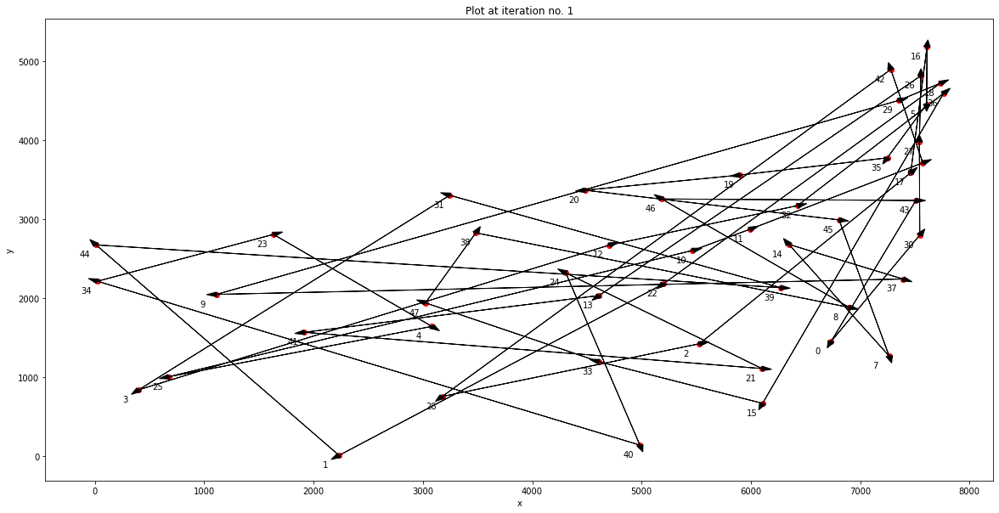

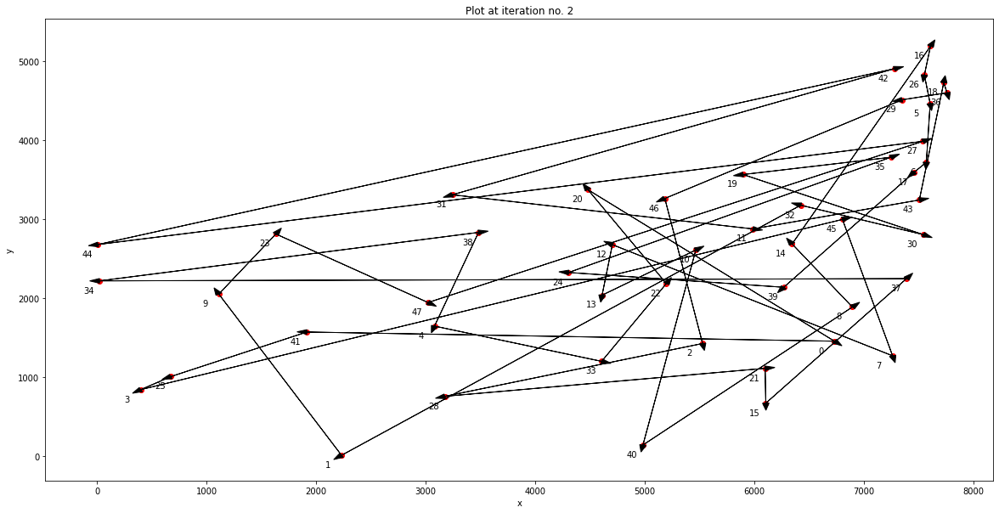

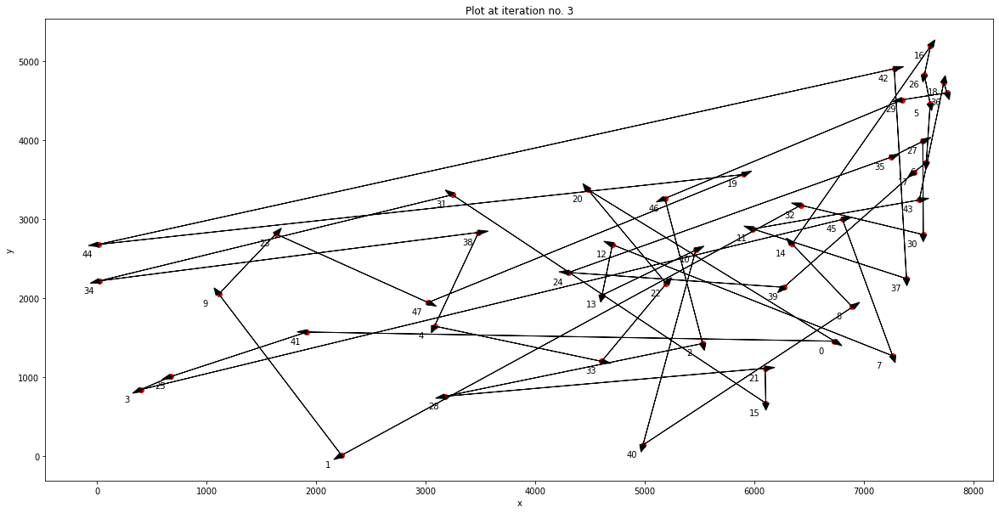

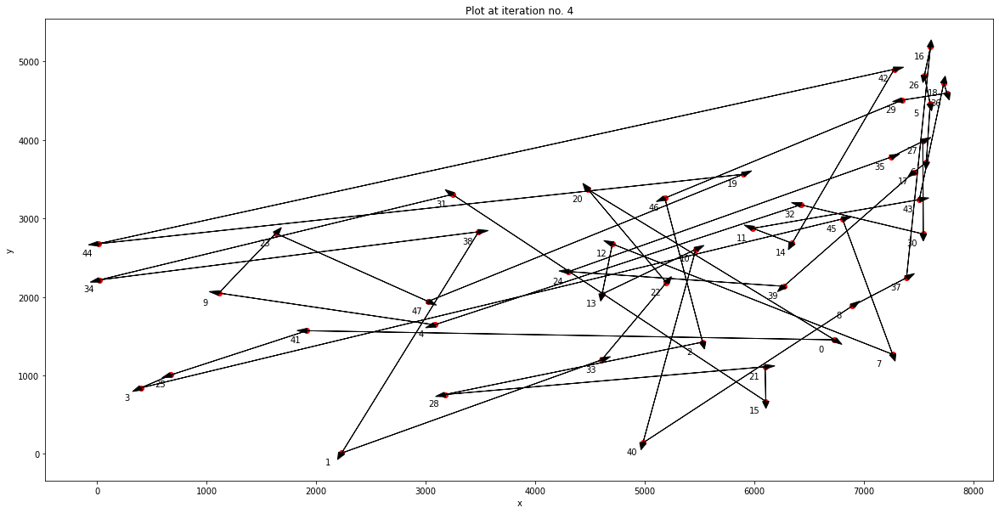

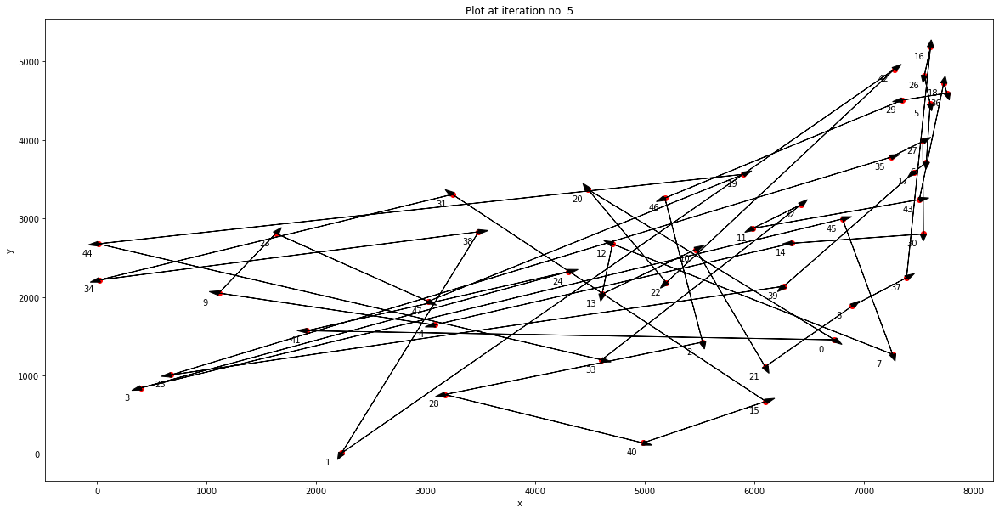

...

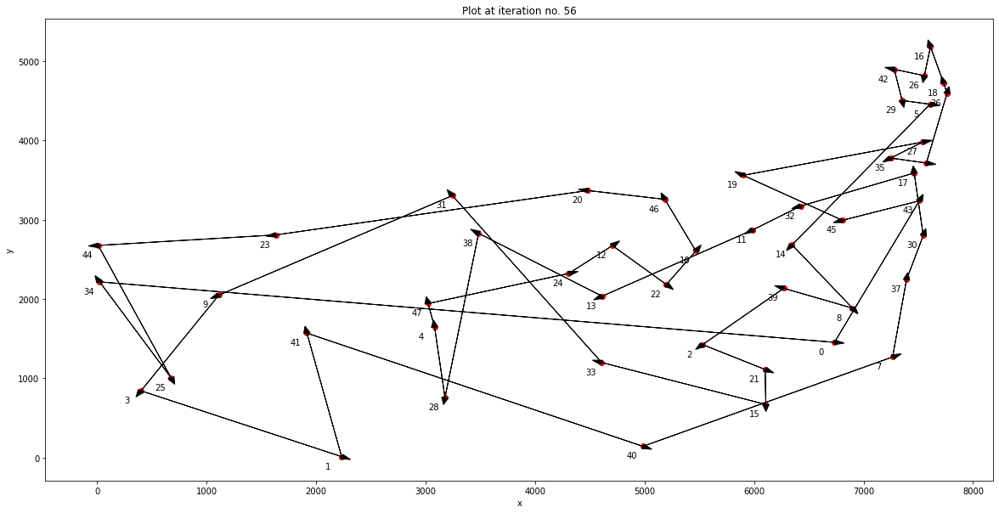

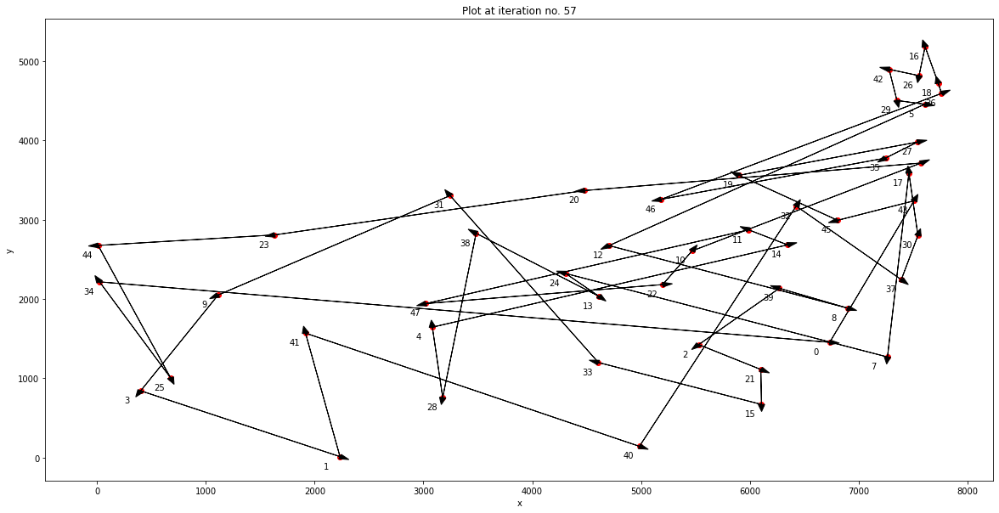

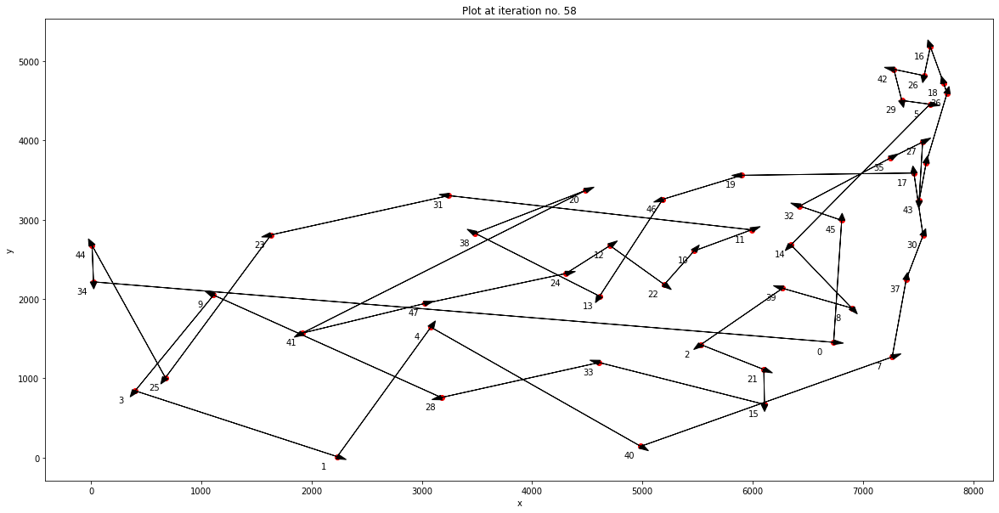

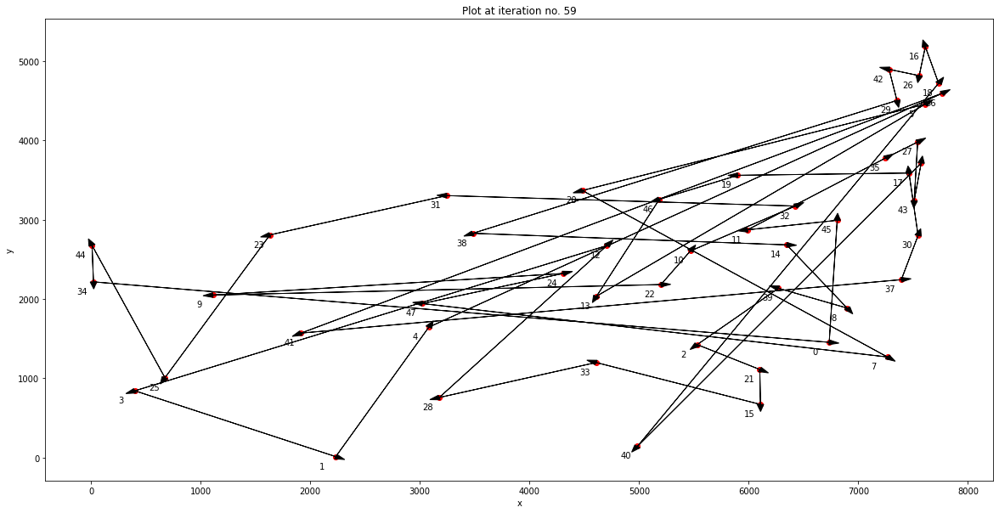

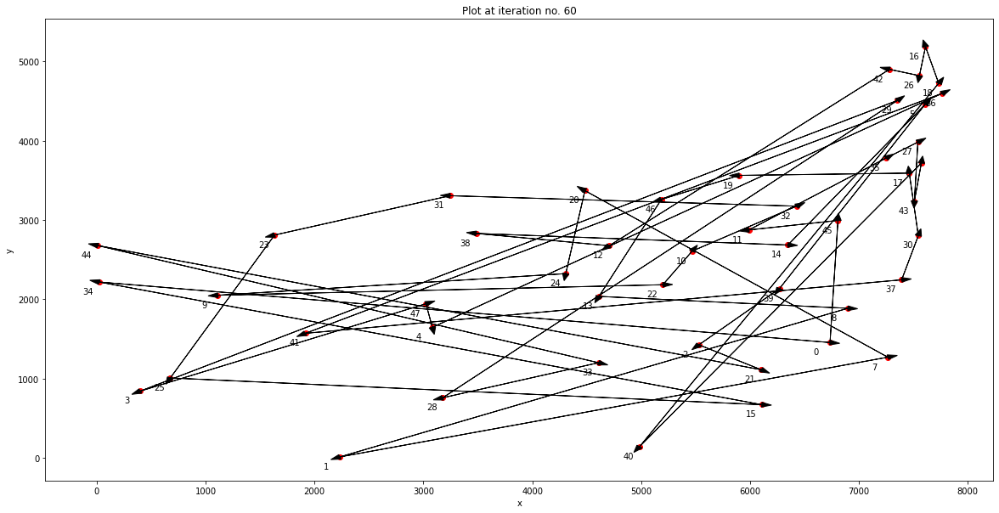

In [11]:
# the intial set of paths that has to be generated 
popSize = 1000
# number of iterations user wants to perform
maxItr = 60
bestRoute, minDistance = TSPSolution(popSize, maxItr)

printing result

In [12]:
# adding 1 at the end so the index 0 will be shown as city 1
print(f'Best Route : {bestRoute[maxItr-1]+1}')
print(f'Minimum Distance : {minDistance}')

Best Route : [ 1 46 12 36 28 44  7 41 19 17 27 43 13 39 15  6 40  3 22 45 34 29 30  4
 48  5 37 42 38 31 18 20 47 14  9  2  8 21 25 10 23 11 33 32 24 26 16 35
  1]
Minimum Distance : 61139


#### (b) Plot the best tour (path connecting city sequence) obtained after each k (user choice for plotting) iterations.

Enter k value 6


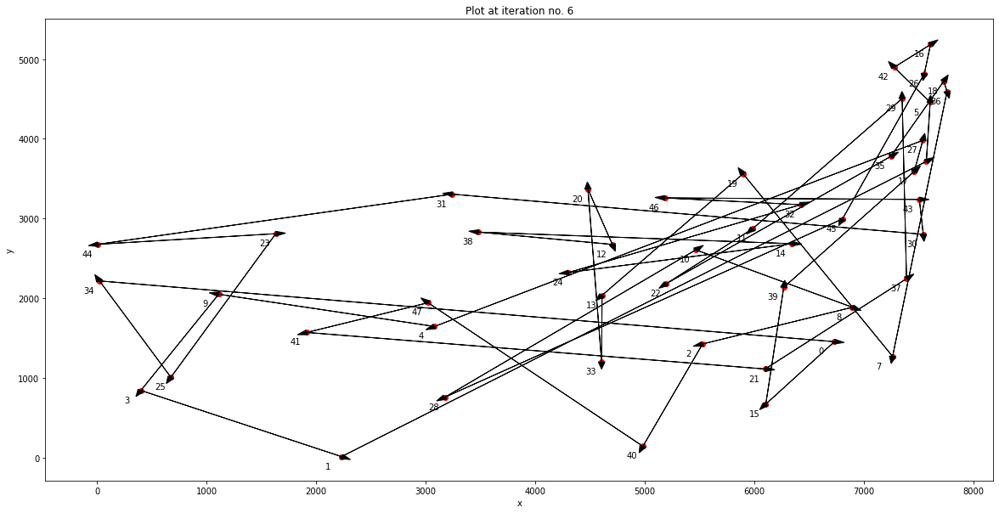

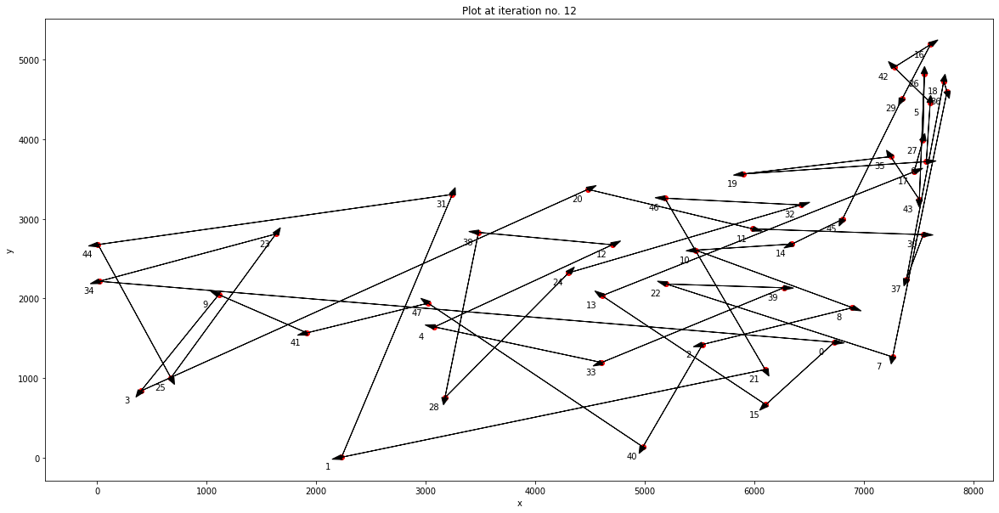

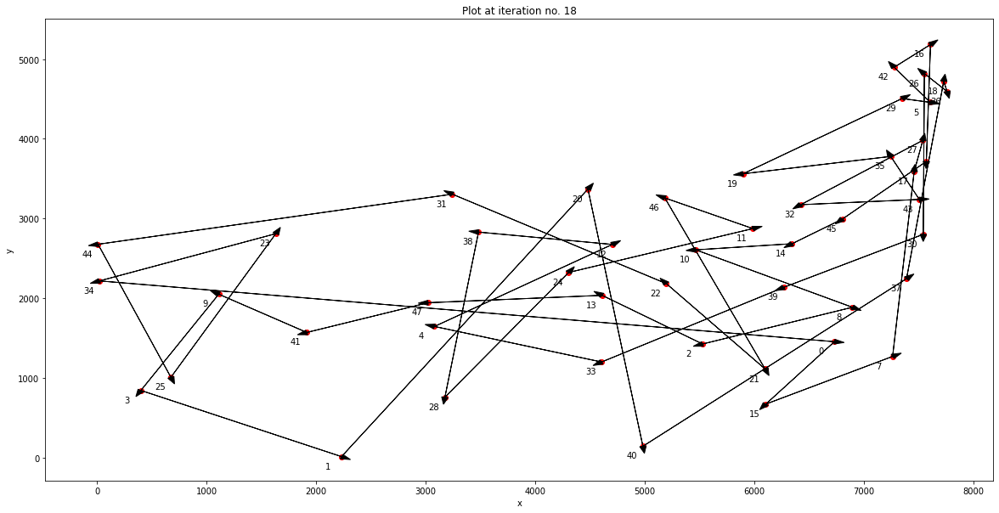

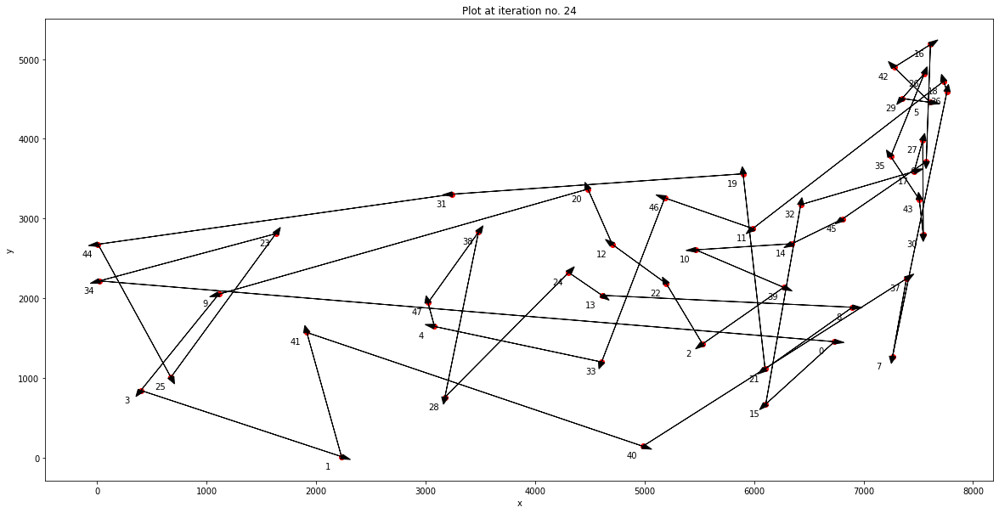

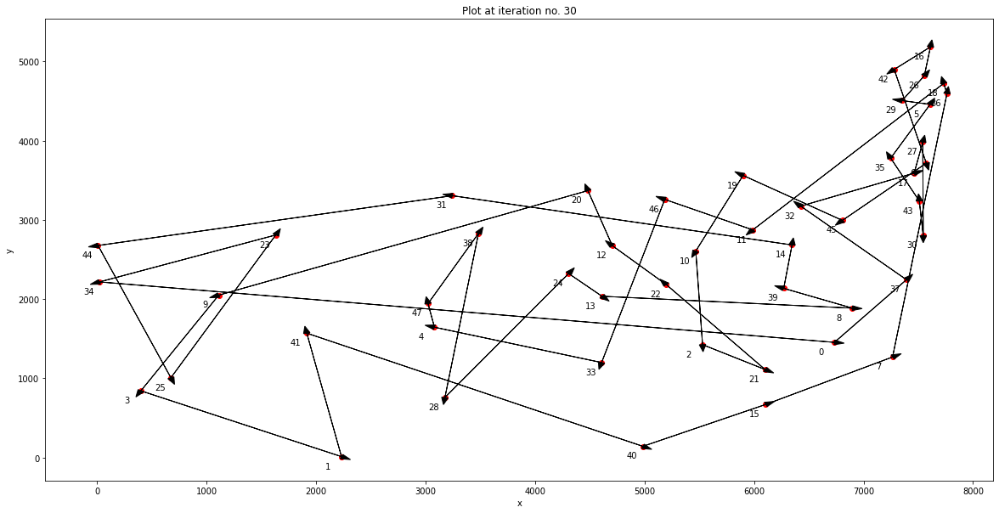

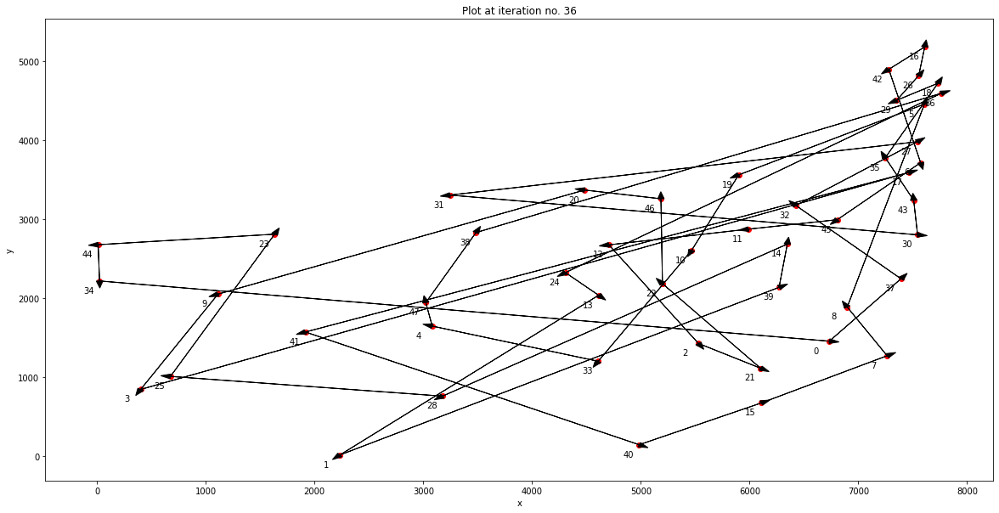

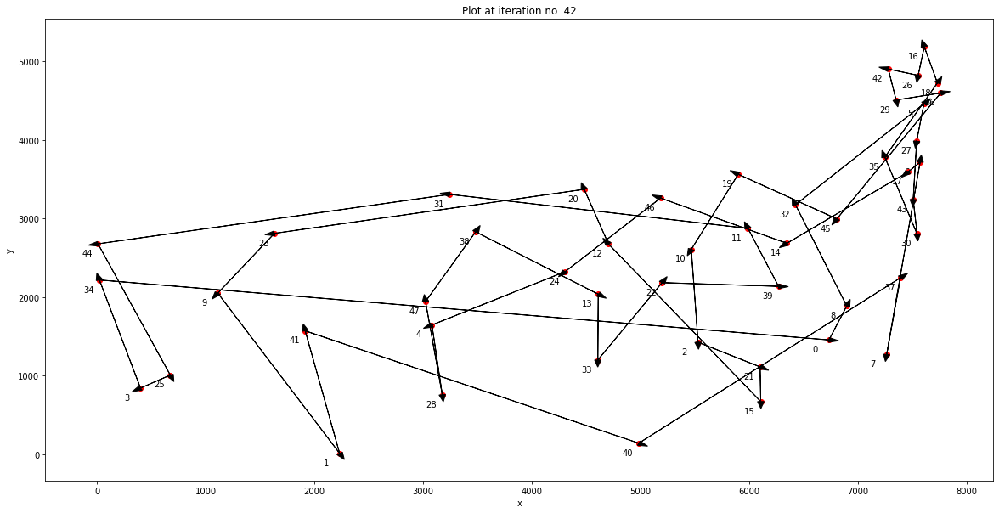

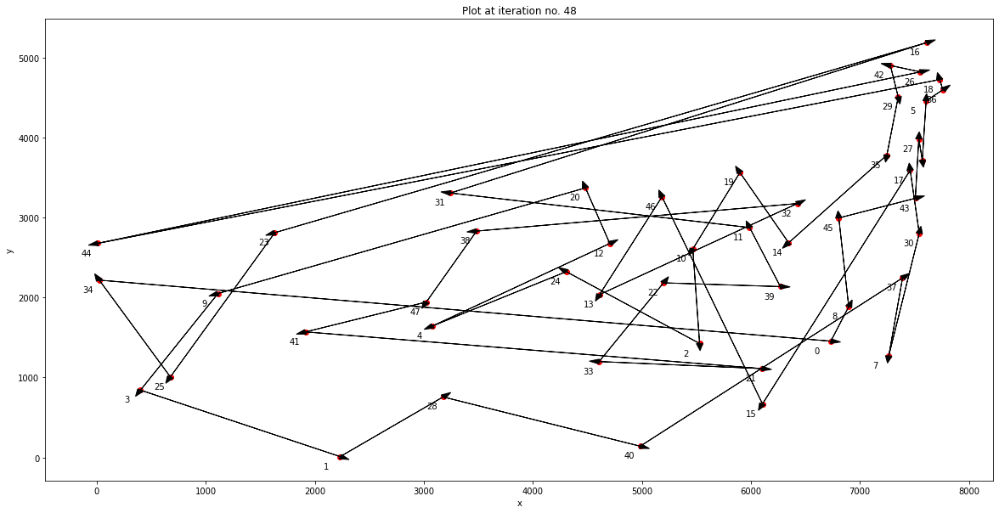

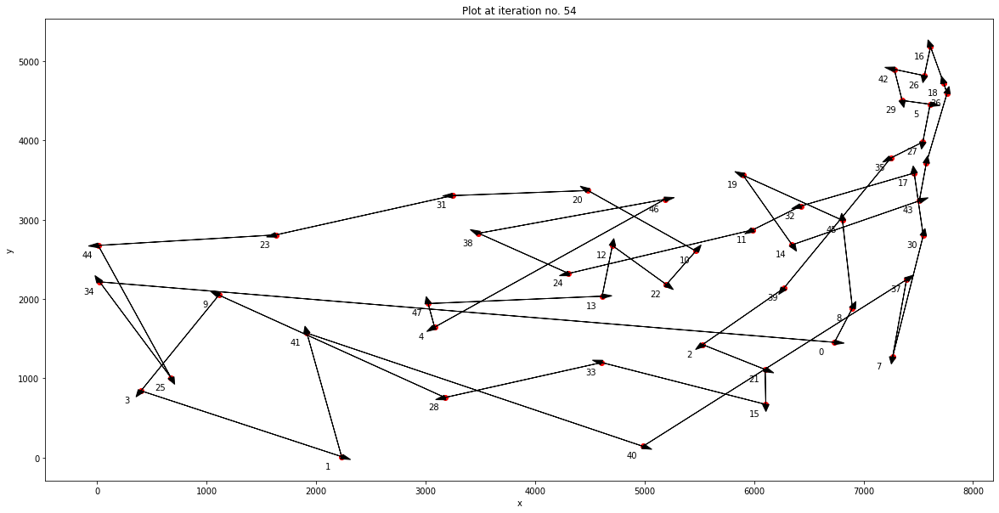

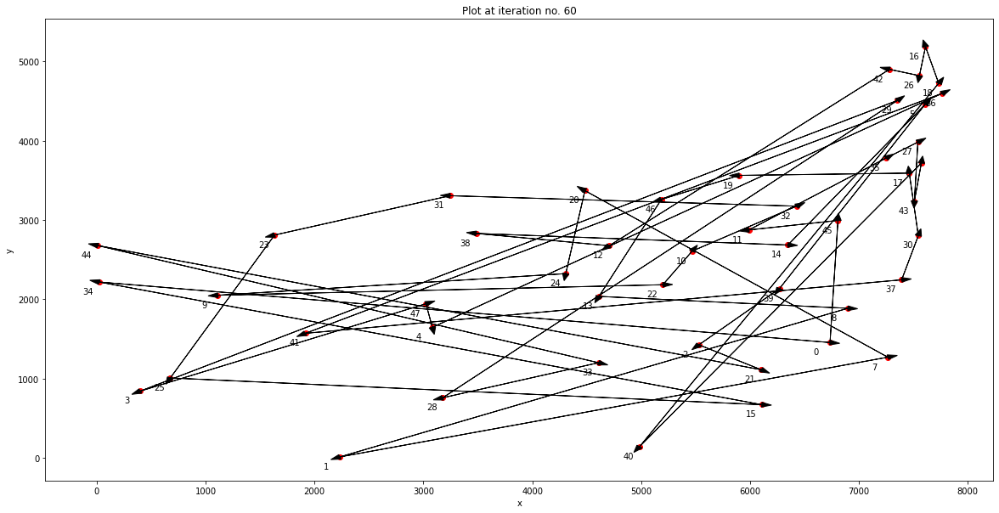

In [13]:
k = int(input('Enter k value '))
# after each k iteration we will print the best result
for index in range(1, maxItr+1):
    if (index+1) % k == 0:
        plotRoute(bestRoute[index], index)

# Problem 2

In [14]:
# Given function
def f(x, y):
    return 1.7 * e ** (-( ((x-3)**2/10) + ((y-3)**2/10) )) + e ** (-( ((x+5)**2/8) + ((y+5)**2/8) )) + 2*e**(-(x**2/4 + y**2/5)) + 1.5*e**(-( ((x-4)**2/18) + ((y+4)**2/16) )) + 1.2*e**(-( ((x+4)**2/18) + ((y-4)**2/16) ))

#### Generates points in the sample space 

In [15]:
def generatePoints(popSize, X_min, X_max):
    points = []
    
    alpha = np.random.uniform(0,1, (popSize, 2))
    
    for index in range(popSize):

        new_point = []
        x1 = (1 - alpha[index][0])*X_min[0] + alpha[index][0]*X_max[0]
        x2 = (1 - alpha[index][1])*X_min[1] + alpha[index][1]*X_max[1]
        
        position = [x1, x2]
        # at index 0 the position value will be stored
        new_point.append(position)

        velocityX1, velocityX2 = 0, 0
        velocity = [velocityX1, velocityX2]
        # at position 1 the  velocity values will be stored by default it is 0
        new_point.append(velocity)

        bestX1, bestX2 = x1, x2
        bestPosition = [bestX1, bestX2]
        # at position 2 the current best position will be store by default it is the intialized value
        new_point.append(bestPosition)
        
        # at position 3 the Yt value will be store
        new_point.append(f(x1, x2))

        points.append(new_point)

    points = np.array(points)
    return points

In [16]:
def PSO(X_min, X_max, popSize, maxItr, psoParamas):
    
    # generate points and by default the initial position will be the best position
    q = generatePoints(popSize, X_min, X_max)
    
    # find the global best position
    values = [ q[index][3] for index in range(popSize)]
    i = np.argmax(values)
    gtX1 = q[i][0][0]
    gtX2 = q[i][0][1]

    # fetch different parameters from psoParamas
    cognitive_comp = psoParamas[0]
    social_comp = psoParamas[1]
    momentum_comp = psoParamas[2]
    
    # make beta and gamma vectors
    beta = np.random.uniform(0,1, (popSize, 2))
    gamma = np.random.uniform(0,1, (popSize, 2))
    
    newYt = np.zeros(popSize)

    for it in range(maxItr):
            # for every point in popSize
            for index in range(popSize):

                # updates velocity in x1
                q[index][1][0] = momentum_comp*q[index][1][0] + cognitive_comp*beta[index][0]*(q[index][2][0]-q[index][0][0]) + social_comp*gamma[index][0]*(gtX1-q[index][0][0])

                # updates velocity in x2
                q[index][1][1] = momentum_comp*q[index][1][1] + cognitive_comp*beta[index][1]*(q[index][2][1]-q[index][0][1]) + social_comp*gamma[index][1]*(gtX2-q[index][0][1])


                # update temporary variables for this iteration
                newPointX1 = q[index][0][0] + q[index][1][0]
                newPointX2 = q[index][0][1] + q[index][1][1]

                newYt[index] = f(newPointX1, newPointX2)
                # Particle best position update
                # update the best position if it is not the first iteration
                if it!= 0:
                    # if the new point is having better fitness value then update the points else leave as it is
                    if newYt[index] > q[index][3]:
                        # updates x and y co ordinates
                        q[index][0][0] = newPointX1
                        q[index][0][1] = newPointX2

                        # update the upcoming previous best for next iteration
                        q[index][3] = f(q[index][0][0], q[index][0][1])

            # calculate the objective function value for each points
            values = [q[index][3] for index in range(popSize)]
            maxIndex = np.argmax(values)
            gtX1 = q[maxIndex][0][0]
            gtX2 = q[maxIndex][0][1]

            X_values = [q[index][0][0] for index in range(popSize)]
            Y_values = [q[index][0][1] for index in range(popSize)]

            # plot
            plt.scatter(X_values, Y_values, color = 'red')
            x = np.linspace(-10,10,100)
            y = np.linspace(-10,10,100)
            a,b = np.meshgrid(x, y)
            F = f(a,b)
            plt.contour(x, y, F, cmap = cm.twilight_shifted);
            plt.xlabel('x')
            plt.ylabel('y')
            plt.title('Contour Plot in 2D')
            plt.show()

    return gtX1, gtX2, f(gtX1, gtX2)

#### Intial Parameters and variables to store the result into

In [17]:
X_min = [-10, -10]
X_max = [10, 10]
bestX, bestY, maxF = np.zeros(5), np.zeros(5), np.zeros(5)

### Test 01 

/tmp/ipykernel_17917/1915286100.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  points = np.array(points)


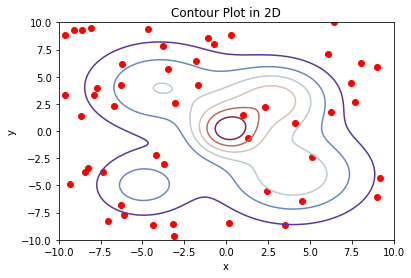

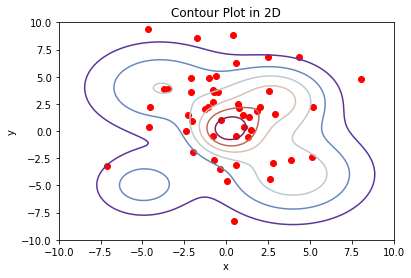

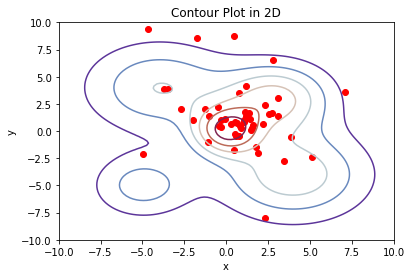

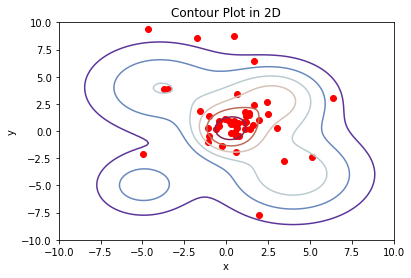

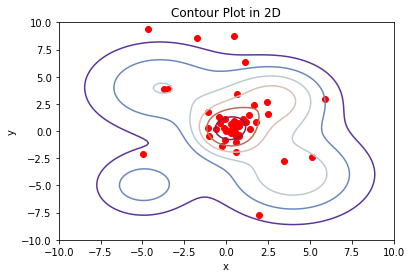

...

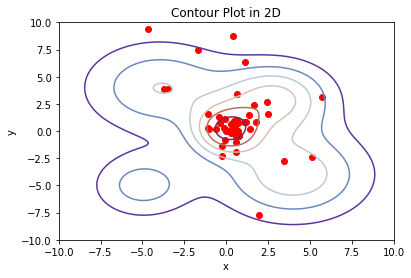

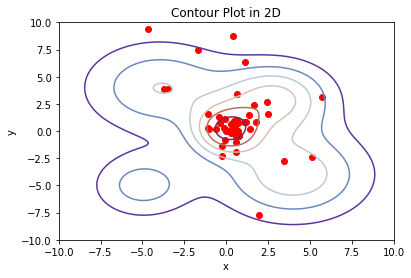

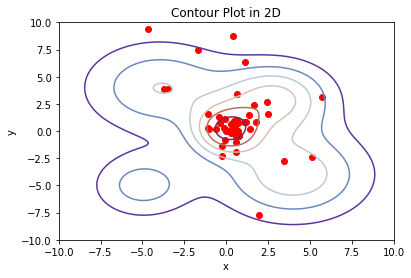

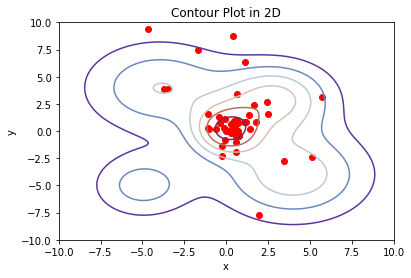

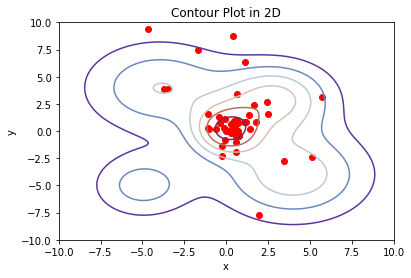

0.3459126503161596 0.19213714687721622 2.717772405814824


In [18]:
popSize = 50
maxItr = 20
intialVelocity = np.zeros((popSize, 2))
cognitive_comp = 0.3
social_comp = 0.63
momentum_comp = 0.5
psoParamas = [cognitive_comp, social_comp, momentum_comp]

bestX[0], bestY[0], maxF[0] = PSO(X_min, X_max, popSize, maxItr, psoParamas)

print(bestX[0], bestY[0], maxF[0])

### Test 02 

/tmp/ipykernel_17917/1915286100.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  points = np.array(points)


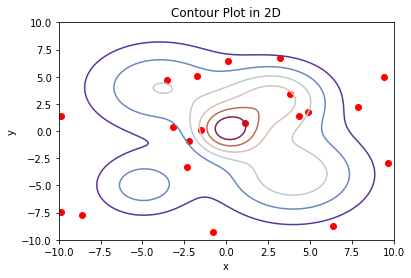

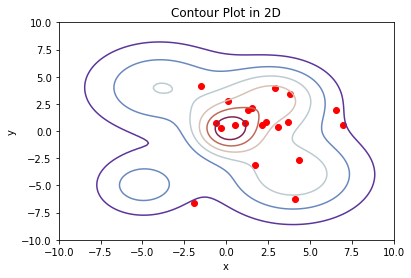

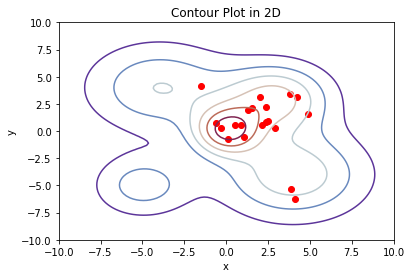

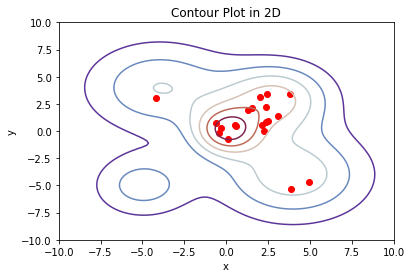

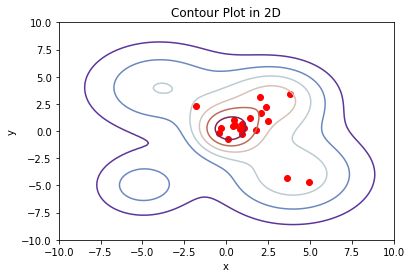

...

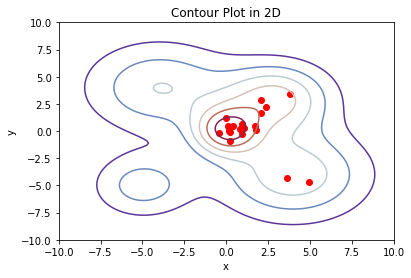

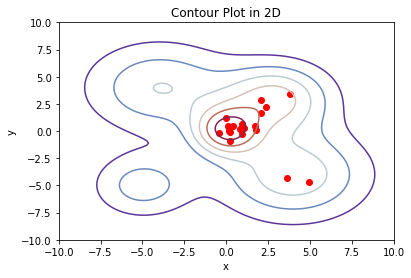

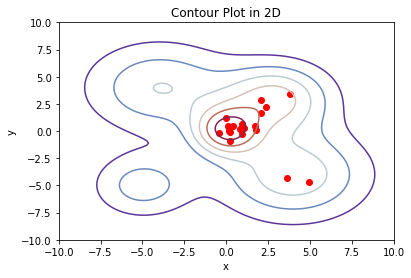

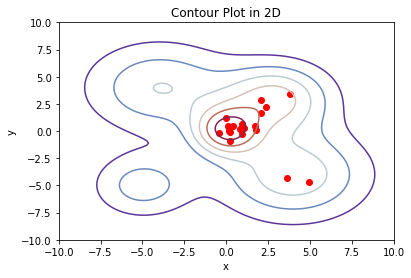

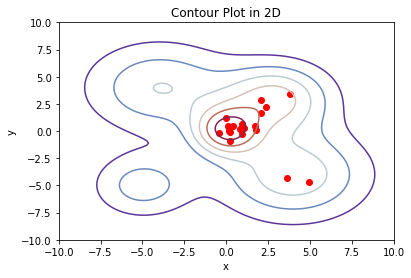

0.16376906719976025 0.21091127886041236 2.7249299731093566


In [19]:
popSize = 20
maxItr = 25
intialVelocity = np.zeros((popSize, 2))
cognitive_comp = 0.2
social_comp = 0.75
momentum_comp = 0.8
psoParamas = [cognitive_comp, social_comp, momentum_comp]

bestX[1], bestY[1], maxF[1] = PSO(X_min, X_max, popSize, maxItr, psoParamas)

print(bestX[1], bestY[1], maxF[1])

### Test 03

/tmp/ipykernel_17917/1915286100.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  points = np.array(points)


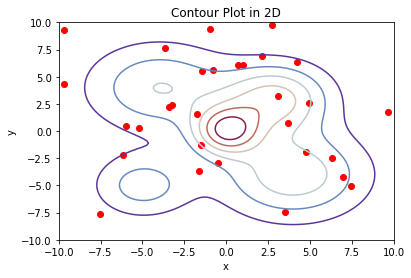

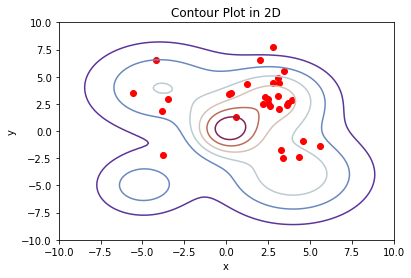

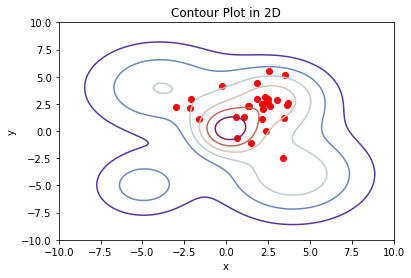

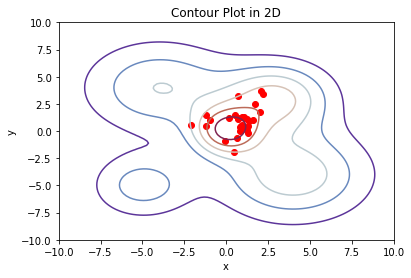

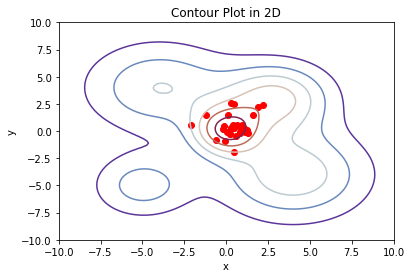

...

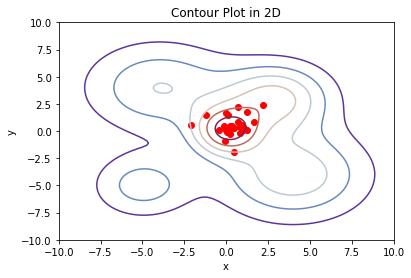

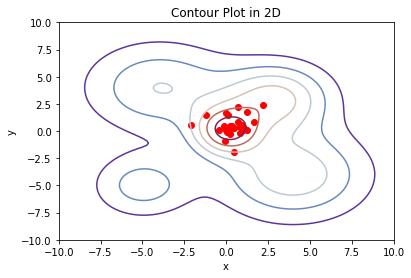

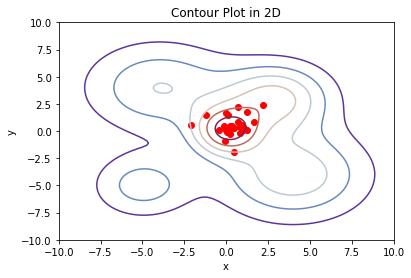

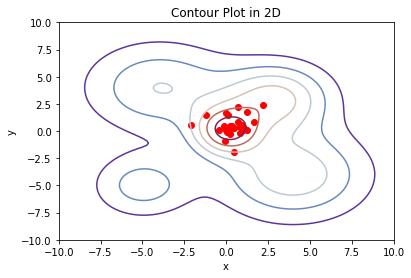

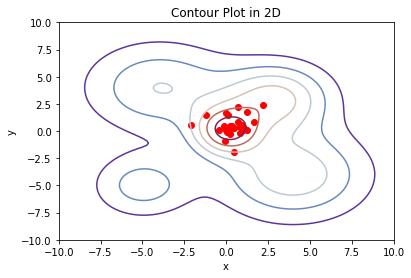

0.28060550881783064 0.2091815191870513 2.7238164911611324


In [20]:
popSize = 30
maxItr = 30
intialVelocity = np.zeros((popSize, 2))
cognitive_comp = 0.2
social_comp = 0.72
momentum_comp = 0.48
psoParamas = [cognitive_comp, social_comp, momentum_comp]

bestX[2], bestY[2], maxF[2] = PSO(X_min, X_max, popSize, maxItr, psoParamas)

print(bestX[2], bestY[2], maxF[2])

### Test 04

/tmp/ipykernel_17917/1915286100.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  points = np.array(points)


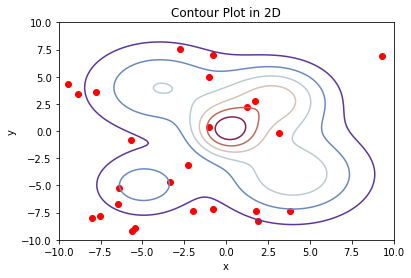

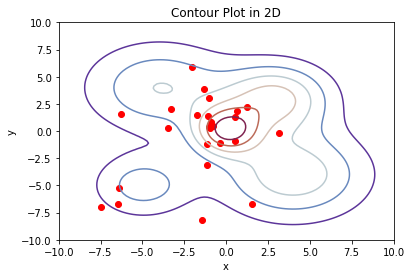

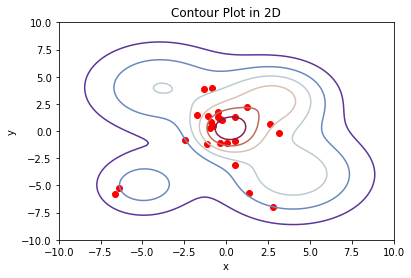

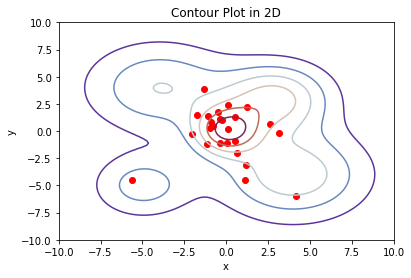

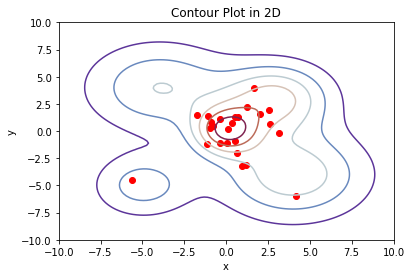

...

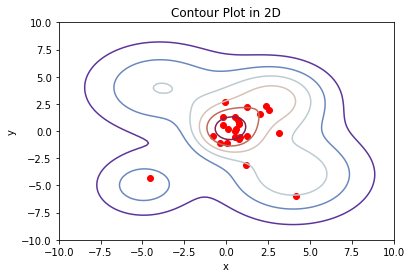

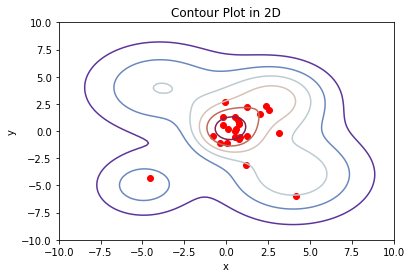

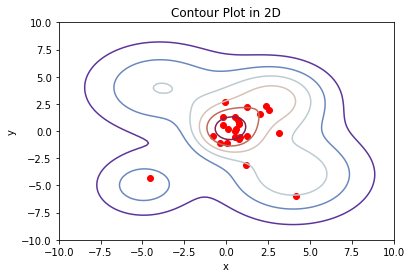

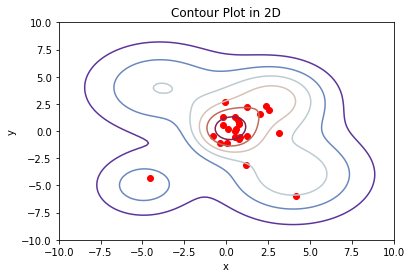

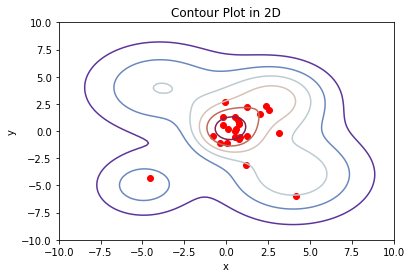

0.14265775145381232 0.206653860953387 2.7238346813632877


In [21]:
popSize = 25
maxItr = 35
intialVelocity = np.zeros((popSize, 2))
cognitive_comp = 0.2
social_comp = 0.8
momentum_comp = 0.9
psoParamas = [cognitive_comp, social_comp, momentum_comp]

bestX[3], bestY[3], maxF[3] = PSO(X_min, X_max, popSize, maxItr, psoParamas)

print(bestX[3], bestY[3], maxF[3])

### Test 05

/tmp/ipykernel_17917/1915286100.py:31: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  points = np.array(points)


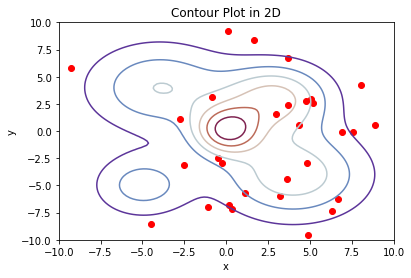

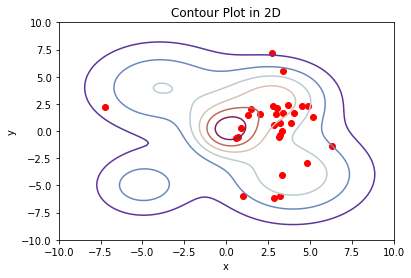

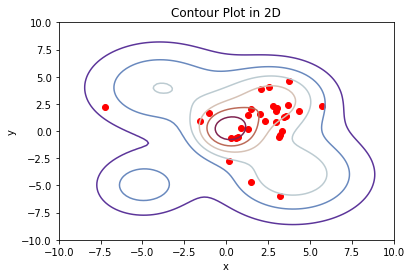

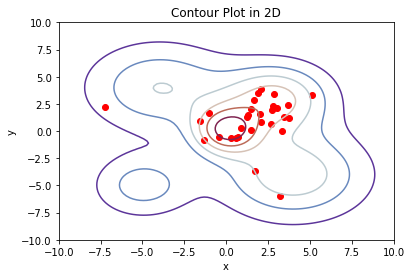

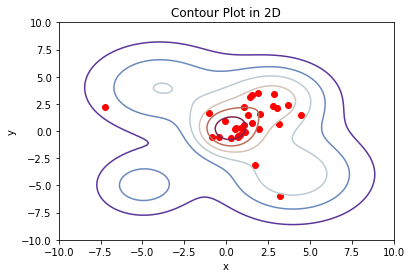

...

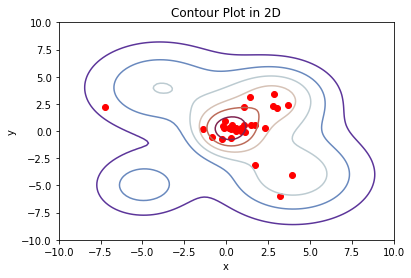

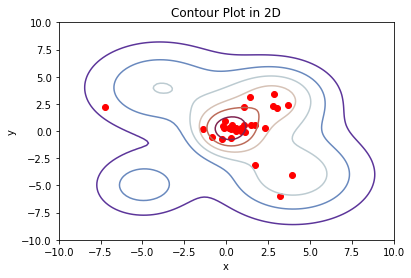

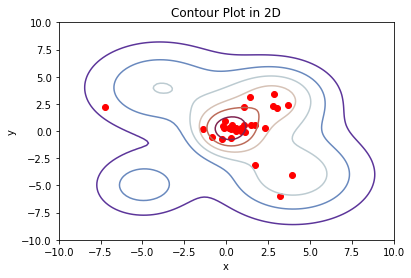

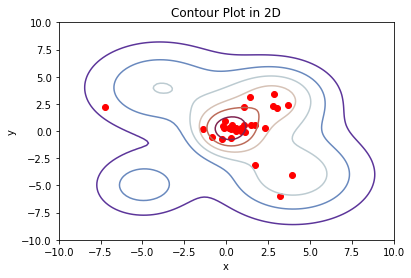

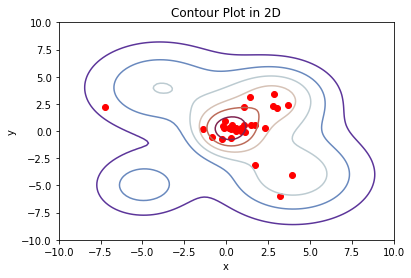

0.26454522804858555 0.17133550975605888 2.7239739627645303


In [22]:
popSize = 30
maxItr = 40
intialVelocity = np.zeros((popSize, 2))
cognitive_comp = 0.2
social_comp = 0.6
momentum_comp = 0.82
psoParamas = [cognitive_comp, social_comp, momentum_comp]

bestX[4], bestY[4], maxF[4] = PSO(X_min, X_max, popSize, maxItr, psoParamas)

print(bestX[4], bestY[4], maxF[4])

### Best Result

In [23]:
print('The best result among the above 4 testcase')
print(f'x : {bestX[np.argmax(maxF)]} y : {bestY[np.argmax(maxF)]} f : {max(maxF)}')

The best result among the above 4 testcase
x : 0.16376906719976025 y : 0.21091127886041236 f : 2.7249299731093566
